# Linear MHD with non-uniform background magnetic field

This script simulates MHD waves in a homogeneous plasma in the background field

\begin{align}
B_{0x}(x)=B_{0x}(0)(1+\xi x^2) \\
B_{0y}(x,y)=-xy\xi B_{0x}(0) \\
B_{0z}(x,z)=-xz\xi B_{0x}(0),
\end{align}

where the y- and z-component are choosen in order to ensure $\nabla\cdot\textbf{B}_0=0$.
The linearized ideal MHD equations then lead to a system for the perturbed quantities (which only vary in the x-direction for simplicity) $\textbf{U}=(u_{1x},u_{1y},u_{1z},B_{1x},B_{1y},B_{1z},\rho_1,p_1)$ of the form:

\begin{align}
\partial_t \textbf{U}(t,x)+A(x,y,z)\partial_x\textbf{U}(t,x)=C(x,y,z)\textbf{U}(t,x),
\end{align}

with some initial condition $\textbf{U}(0,x)$ and periodic boundary conditions $\textbf{U}(t,-L)=\textbf{U}(t,L)$.
The matrices are

\begin{align}
A(x,y,z)=
\begin{pmatrix}
0 &0 &0 &0 &B_{0y}/\rho_0 &B_{0y}/\rho_0 &0 &1/(2\rho_0) \\
0 &0 &0 &0 &-B_{0x}/\rho_0 &0 &0 &0 \\
0 &0 &0 &0 &0 &-B_{0x}/\rho_0 &0 &0 \\
0 &0 &0 &0 &0 &0 &0 &0 \\
B_{0y} &-B_{0x} &0 &0 &0 &0 &0 &0 \\
B_{0z} &0 &-B_{0x} &0 &0 &0 &0 &0 \\
\rho_0 &0 &0 &0 &0 &0 &0 &0 \\
\gamma p_0 &0 &0 &0 &0 &0 &0 &0 
\end{pmatrix}
\end{align}

and
\begin{align}
C(x,y,z)=
\begin{pmatrix}
0 &0 &0 &0 &-\partial_x B_{0y}/\rho_0 &-\partial_x B_{0y}/\rho_0 &0 &0 \\
0 &0 &0 &\partial_x B_{0y}/\rho_0 &0 &0 &0 &0 \\
0 &0 &0 &\partial_x B_{0z}/\rho_0 &0 &0 &0 &0 \\
\partial_y B_{0y}+\partial_z B_{0z} &0 &0 &0 &0 &0 &0 &0 \\
-\partial_x B_{0y} &\partial_x B_{0x}+\partial_z B_{0z} &0 &0 &0 &0 &0 &0 \\
-\partial_x B_{0z} &0 &\partial_x B_{0x}+\partial_y B_{0y} &0 &0 &0 &0 &0 \\
0 &0 &0 &0 &0 &0 &0 &0 \\
0 &0 &0 &0 &0 &0 &0 &0 
\end{pmatrix}
\end{align}

The numerical method is Lax-Wendroff Finite Differences scheme.

Positive advection speed:[1. 3. 5.]
Negative advection speed:[2. 4. 6.]
Choose your initial condition 1



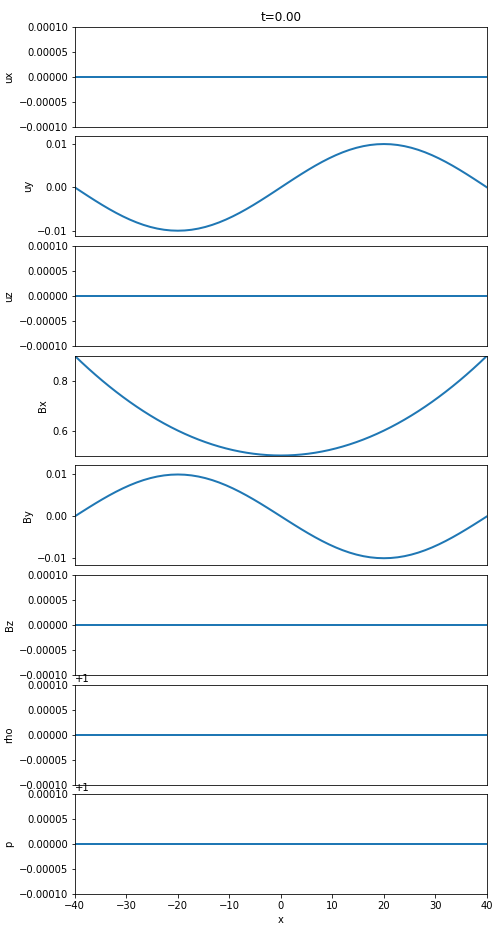
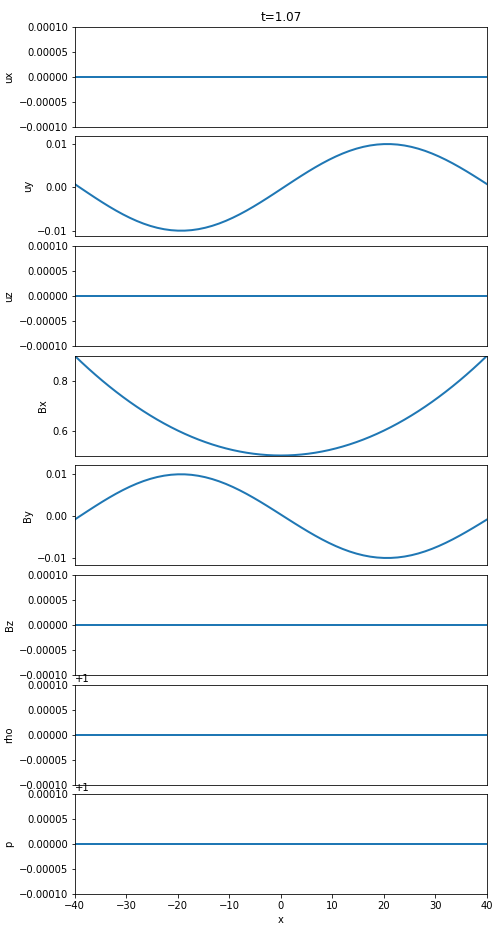
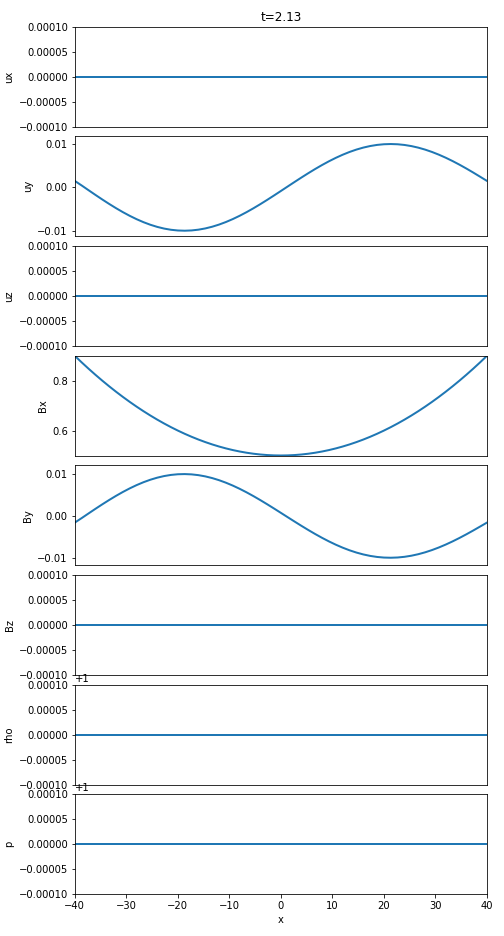
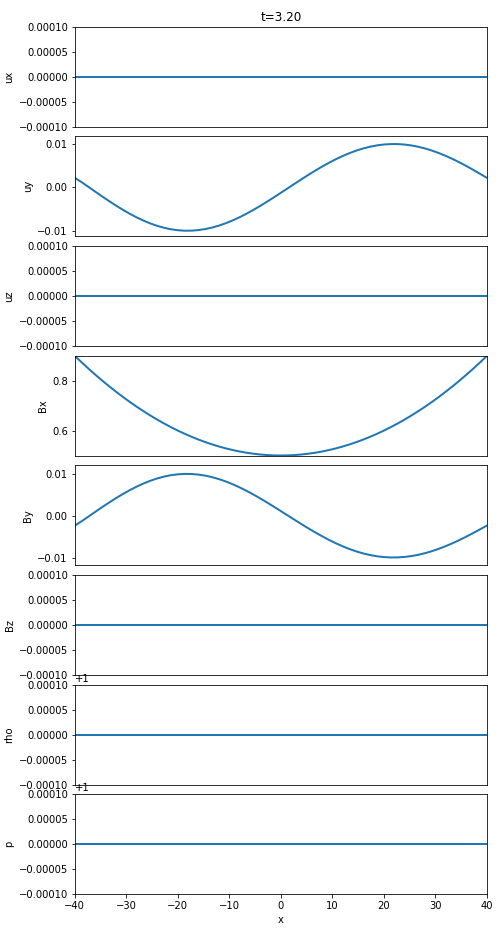
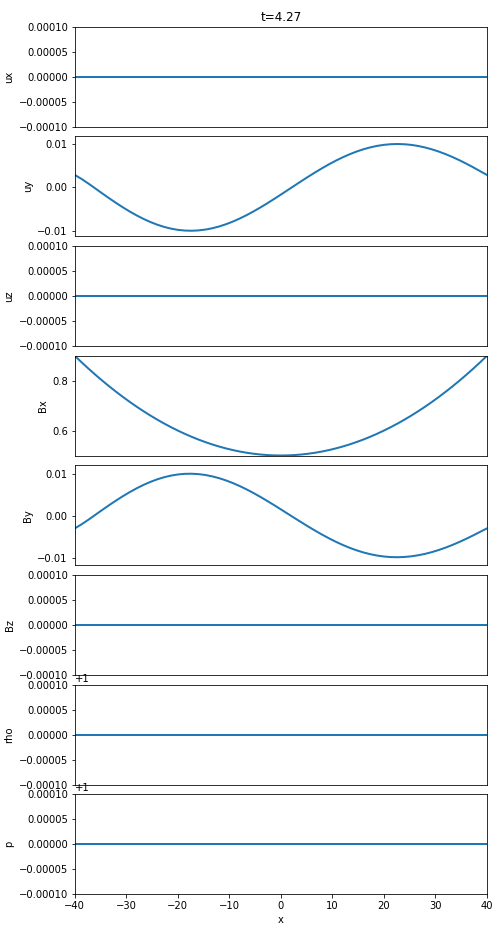
...
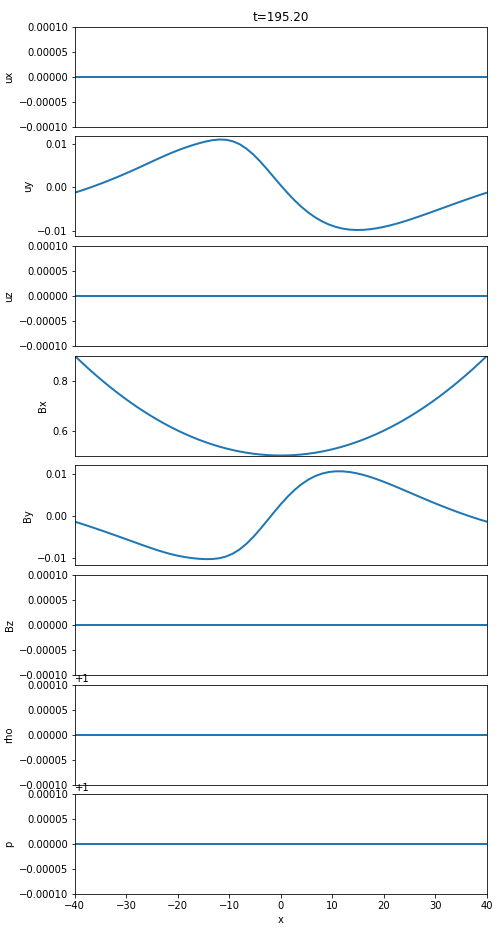
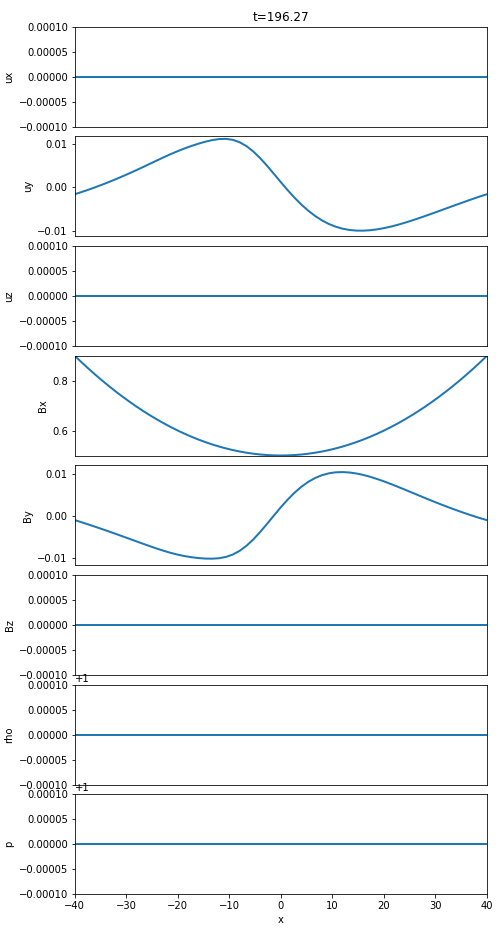
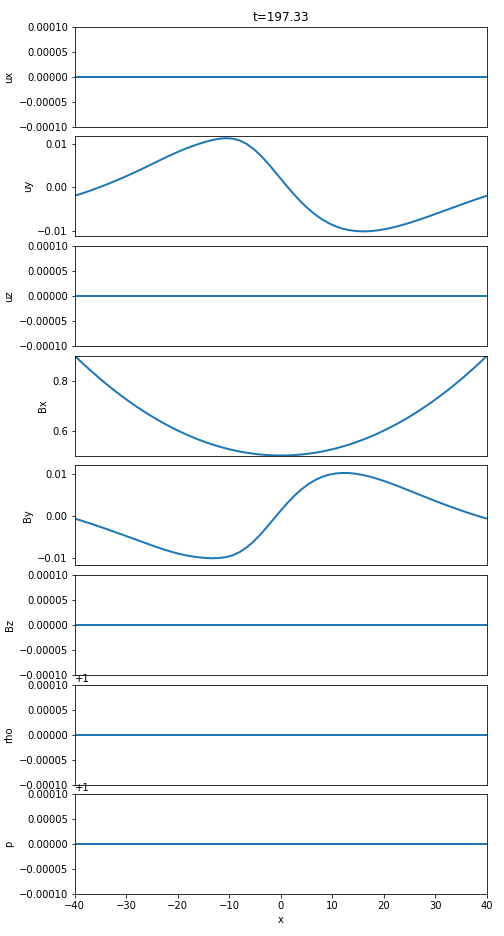
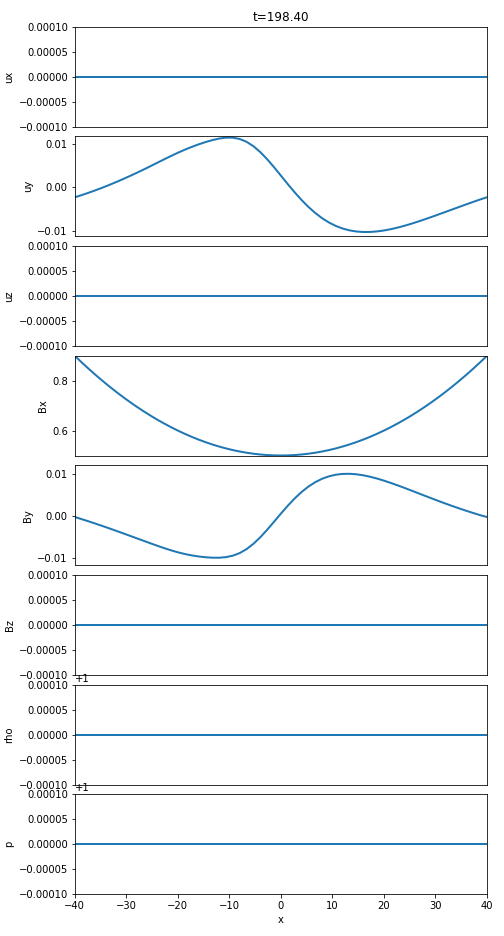
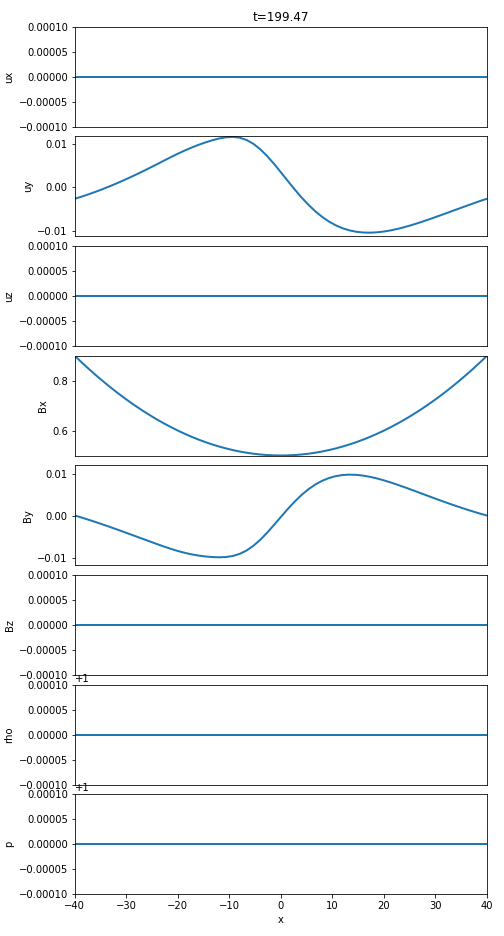

In [37]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from JSAnimation import IPython_display
from matplotlib import animation
from scipy.linalg import block_diag
from numpy.linalg import inv
from numpy import linalg as LA
from scipy.linalg import expm, sinm, cosm
import sys
from matplotlib.patches import Circle


#Author: Florian Holderied
#Last update: 13.03.2018




#Input Parameters
rho0 = 1                    #Mass density of plasma
p0 = 1                      #Pressure of plasma
gamma = 5/3                 #Adiabatic exponent
a = 0.01                    #Amplitude of pertubations
L = 40                      #Length of x-domain in + and - direction (L_tot=2L)
T = 200                     #Simulation time
Nx = 60                     #Number of grid cells in x-direction
CFL = 0.4                   #CFL-condition (at least < 1 for stability)
init = 1                    #Shape of initial condition (1: sine-shaped, 2: 1/cosh-shaped, 3: Gauss-shaped)
B0x0 = 0.5                  #Magnetic field in x direction at x = 0
xi = 5e-4                   #Magnitude of the background field in x-direction
y = 0                       #Location in y-direction
z = 0                       #Location in z-direction
on = 1                      #C-matrix on or off (0: off, 1: on)








# Define fields and its derivatives
def B0x(x):
    return B0x0*(1+xi*x**2)

def B0y(x,y):
    return -x*y*xi*B0x0

def B0z(x,z):
    return -x*z*xi*B0x0

def dx_B0x(x):
    return 2*B0x0*xi*x

def dx_B0y(x,y):
    return -y*xi*B0x0

def dx_B0z(x,z):
    return -z*xi*B0x0

def dy_B0y(x,y):
    return -x*xi*B0x0

def dz_B0z(x,z):
    return -x*xi*B0x0




# Define matrices
def A(x,y,z):
    A0 = np.array([0,0,0,0,B0y(x,y)/rho0,B0z(x,z)/rho0,0,1/(2*rho0)])
    A1 = np.array([0,0,0,0,-B0x(x)/rho0,0,0,0])                
    A2 = np.array([0,0,0,0,0,-B0x(x)/rho0,0,0])                
    A3 = np.array([0,0,0,0,0,0,0,0])                
    A4 = np.array([B0y(x,y),-B0x(x),0,0,0,0,0,0])                
    A5 = np.array([B0z(x,z),0,-B0x(x),0,0,0,0,0])                
    A6 = np.array([rho0,0,0,0,0,0,0,0])                
    A7 = np.array([p0*gamma,0,0,0,0,0,0,0])              
    return np.array([A0,A1,A2,A3,A4,A5,A6,A7])


def C(x,y,z):
    C0 = np.array([0,0,0,0,-dx_B0y(x,y)/rho0,-dx_B0z(x,z)/rho0,0,0])
    C1 = np.array([0,0,0,dx_B0y(x,y)/rho0,0,0,0,0])                
    C2 = np.array([0,0,0,dx_B0z(x,z)/rho0,0,0,0,0])                
    C3 = np.array([dy_B0y(x,y)+dz_B0z(x,z),0,0,0,0,0,0,0])                
    C4 = np.array([-dx_B0y(x,y),dx_B0x(x)+dz_B0z(x,z),0,0,0,0,0,0])                
    C5 = np.array([-dx_B0z(x,z),0,dx_B0x(x)+dy_B0y(x,y),0,0,0,0,0])                
    C6 = np.array([0,0,0,0,0,0,0,0])                
    C7 = np.array([0,0,0,0,0,0,0,0])              
    return np.array([C0,C1,C2,C3,C4,C5,C6,C7])







Astart=A(0,y,z)

#Eigenvalues (Advection speed) and eigenvectors (initial conditions)
v,w = LA.eig(Astart)
indicespos = np.array([])
indicesneg = np.array([])


#Sort by positve and negative advection speeds
for i in range(0,v.size):
    if v[i]>0:
        indicespos = np.append(indicespos,i)
    elif v[i]<0:
        indicesneg = np.append(indicesneg,i)
        

#Choice of initial condition        
print('Positive advection speed:'+str(indicespos))
print('Negative advection speed:'+str(indicesneg))
initial=int(input("Choose your initial condition ")) 


#Normalisation of inital condition
U0 = a*w[:,initial]/np.amax(abs(w[:,initial]))
v = v[initial]



#Discretisation of space and time 
deltax = 2*L/Nx
deltat = deltax*CFL/np.abs(v)
Nt = np.int(T/deltat)
T = Nt*deltat
x = np.linspace(-L,L,Nx+1)

t = np.linspace(0,T,Nt+1)




#Initial condition for Finite Differences
def initial_Conditions(x,fun,L):
    if fun==1:
        return np.outer(U0,np.sin(x*np.pi/L))
    elif fun==2:
        return np.outer(U0,1/np.cosh(40*x/L))
    elif fun==3:
        return np.outer(U0,np.exp(-x**2/10))
    
    

    
    
    

#Lax-Wendroff scheme with matrix notation U=(u1x,u1y,u1z,B1x,B1y,B1z,rho1,p1)
def Lax_Wendroff():
    U = np.zeros((Nt+1,Nx+1,8))
    U[0,:,:] = np.transpose(initial_Conditions(x,init,L))
  #  xnew = np.linspace(-L/2,L/2,int(Nx/2+1))
  #  U[0,int(Nx/4):int(3*Nx/4+1),:] = np.transpose(initial_Conditions(xnew,init,L/2))
    
    for n in range(0,Nt):
        for j in range(0,Nx):
            if j==0:        
                U[n+1,j,:] = U[n,j,:]-deltat/(2*deltax)*np.dot(A(x[j],y,z),U[n,j+1,:]-U[n,-2,:])+deltat**2/(2*deltax**2)*(np.dot(np.dot(A(x[j],y,z),A(x[j],y,z)),U[n,j+1,:]-2*U[n,j,:]+U[n,-2,:]))+deltat*on*np.dot(C(x[j],y,z),U[n,j,:])
                U[n+1,-1,:] = U[n+1,0,:]
            elif j==Nx-1:              
                U[n+1,j,:] = U[n,j,:]-deltat/(2*deltax)*np.dot(A(x[j],y,z),U[n,0,:]-U[n,j-1,:])+deltat**2/(2*deltax**2)*(np.dot(np.dot(A(x[j],y,z),A(x[j],y,z)),U[n,0,:]-2*U[n,j,:]+U[n,j-1,:]))+deltat*on*np.dot(C(x[j],y,z),U[n,j,:])
                U[n+1,-1,:] = U[n+1,0,:]
            else:              
                U[n+1,j,:] = U[n,j,:]-deltat/(2*deltax)*np.dot(A(x[j],y,z),U[n,j+1,:]-U[n,j-1,:])+deltat**2/(2*deltax**2)*(np.dot(np.dot(A(x[j],y,z),A(x[j],y,z)),U[n,j+1,:]-2*U[n,j,:]+U[n,j-1,:]))+deltat*on*np.dot(C(x[j],y,z),U[n,j,:])
                U[n+1,-1,:] = U[n+1,0,:]
     
    P = np.zeros((Nt+1,Nx+1,8))
    P[:,:,0] = U[:,:,0]
    P[:,:,1] = U[:,:,1]
    P[:,:,2] = U[:,:,2]
    P[:,:,3] = U[:,:,3]+B0x(x)
    P[:,:,4] = U[:,:,4]+B0y(x,y)
    P[:,:,5] = U[:,:,5]+B0z(x,z)
    P[:,:,6] = U[:,:,6]+rho0
    P[:,:,7] = U[:,:,7]+p0   
    return P

                
                
Test = Lax_Wendroff()









# Animation    
f, (a1, a2, a3, a4, a5, a6, a7, a8) = plt.subplots(8,1,sharex=True)
f.set_figheight(13)
f.set_figwidth(7)
a1.set_title('t=0.00')
a1.set_xlim((-L,L))
a2.set_xlim((-L,L))
a3.set_xlim((-L,L))
a4.set_xlim((-L,L))
a5.set_xlim((-L,L))
a6.set_xlim((-L,L))
a7.set_xlim((-L,L))
a8.set_xlim((-L,L))
a1.set_ylim((np.min(Test[:,:,0])-0.0001,np.max(Test[:,:,0])+0.0001))
a2.set_ylim((np.min(Test[:,:,1])-0.0001,np.max(Test[:,:,1])+0.0001))
a3.set_ylim((np.min(Test[:,:,2])-0.0001,np.max(Test[:,:,2])+0.0001))
a4.set_ylim((np.min(Test[:,:,3])-0.0001,np.max(Test[:,:,3])+0.0001))
a5.set_ylim((np.min(Test[:,:,4])-0.0001,np.max(Test[:,:,4])+0.0001))
a6.set_ylim((np.min(Test[:,:,5])-0.0001,np.max(Test[:,:,5])+0.0001))
a7.set_ylim((np.min(Test[:,:,6])-0.0001,np.max(Test[:,:,6])+0.0001))
a8.set_ylim((np.min(Test[:,:,7])-0.0001,np.max(Test[:,:,7])+0.0001))
a1.set_ylabel('ux')
a2.set_ylabel('uy')
a3.set_ylabel('uz')
a4.set_ylabel('Bx')
a5.set_ylabel('By')
a6.set_ylabel('Bz')
a7.set_ylabel('rho')
a8.set_ylabel('p')
a1.tick_params(axis='x',which='both',bottom='off',top='off',labelbottom='off') 
a2.tick_params(axis='x',which='both',bottom='off',top='off',labelbottom='off') 
a3.tick_params(axis='x',which='both',bottom='off',top='off',labelbottom='off') 
a4.tick_params(axis='x',which='both',bottom='off',top='off',labelbottom='off') 
a5.tick_params(axis='x',which='both',bottom='off',top='off',labelbottom='off') 
a6.tick_params(axis='x',which='both',bottom='off',top='off',labelbottom='off') 
a7.tick_params(axis='x',which='both',bottom='off',top='off',labelbottom='off') 
line1,=a1.plot([],[], lw=2)
line2,=a2.plot([],[], lw=2)
line3,=a3.plot([],[], lw=2)
line4,=a4.plot([],[], lw=2)
line5,=a5.plot([],[], lw=2)
line6,=a6.plot([],[], lw=2)
line7,=a7.plot([],[], lw=2)
line8,=a8.plot([],[], lw=2)
a8.set_xlabel('x')
plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0.1)

def init():  
    line1.set_data([], [])
    line2.set_data([], [])
    line3.set_data([], [])
    line4.set_data([], [])
    line5.set_data([], [])
    line6.set_data([], [])
    line7.set_data([], [])
    line8.set_data([], [])
    return line1,

def animate(i):
    line1.set_data(x,Test[i,:,0])
    line2.set_data(x,Test[i,:,1])
    line3.set_data(x,Test[i,:,2])
    line4.set_data(x,Test[i,:,3])
    line5.set_data(x,Test[i,:,4])
    line6.set_data(x,Test[i,:,5])
    line7.set_data(x,Test[i,:,6])
    line8.set_data(x,Test[i,:,7])
    a1.set_title('t='+'%.2f' % t[i])
    return line1,

animation.FuncAnimation(f, animate, init_func=init, frames=Nt+1, interval=50, blit=True)

# Visualisation of background field in the x-y-plane

Text(0.5,1,'Field lines of background field at z = 0')

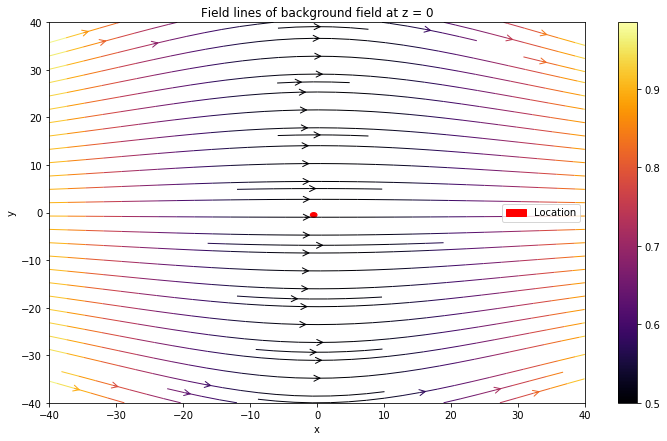

In [38]:
xgrid = np.linspace(-L,L,Nx+1)
ygrid = np.linspace(-L,L,Nx+1)
X, Y = np.meshgrid(xgrid,ygrid)


Bx = B0x(X)
By = B0y(X,Y)


fig2 = plt.figure()
fig2.set_figheight(7)
fig2.set_figwidth(12)
ax = fig2.add_subplot(111)
color = np.hypot(Bx,By)
strm = ax.streamplot(X, Y, Bx, By, color=color, linewidth=1, cmap=plt.cm.inferno,
              density=1, arrowstyle='->', arrowsize=1.5)
test = Circle((0-0.5,y-0.5), 0.5, color='r')
ax.add_patch(test)
test.set(label='Location')
fig2.colorbar(strm.lines)
plt.xlabel('x')
plt.ylabel('y')
ax.legend()
plt.title('Field lines of background field at z = 0')